# Assignment 4
# Part II: Semi-supervised Low-level Segmentation

## Problem 1
### Implement interactive seed-based segmentation using s/t graph cut algorithm.
#### A basic seed-interactive GUI "GraphCutsPresenter" is available (implemented in "asg1.py"). The starter code below uses it. Presenter allows to add seeds (left and right mouse clicks for object and background seeds) and displays these seeds over the image. However, instead of proper graph cut segmentation the provided code displays some fixed binary mask (just as an example of a mask). This "fixed" mask should be replaced by the output of an interactive image segmentation method based on minimum s/t graph cut respecting the hard constraints marked by the user-seeds. You can use an existing python library for computing minimum s/t cuts on arbitrary graphs (run "$\text{pip install PyMaxFlow}$" in Anaconda Prompt , see <a href="http://pmneila.github.io/PyMaxflow/maxflow.html">documentation</a>). You can use this library to build a weighted graph based on selected image and user-entered seeds.
#### As a <font color="red"> first milestone </font>, you should implement graph cut algorithm for minimizing the loss (see slide 109 topic 9)  
#### $$ -\sum_{p\in \Omega_{\mathcal L}} \log S_p^{y_p} \;\;+\;\;\lambda \sum_{pq\in N} w_{pq}\,[S_p \neq S_q] $$ 
#### combining the seed loss (hard constraints for user-defined labels) and basic pair-wise regularization loss with "contrast-weights" $w_{pq} = \exp\frac{-\|I_p-I_q\|^2}{\sigma^2}$ for 4-connected grid neighborhood. Note that the scalar (hyper-parameter) $\lambda$ controlling the regularization strength can be integrated into edge weights $\tilde{w}_{pq} = \lambda \exp\frac{-\|I_p-I_q\|^2}{\sigma^2}$ (parameter $\lambda$ is primarily needed for the second milestone below). Terminal "t-links" for seed-points should make sure that such graph nodes can not be severed from the corresponding terminals. You have to use "large-enough" finite cost t-links to enforce hard-constraints (user seeds) since "infinity" weight is not possible to implement. One can argue that $N\cdot \max \{\tilde{w}_{pq}\}\equiv N\lambda$ (number of neighbors at each point times the largest n-link weight) is sufficient.
#### Once the first version of your interactive segmentation above is implemented and <u> tested</u>, your <font color="red">second milestome</font> is to add color-based likelihood term (slide 149) into the total loss 
#### $$ -\sum_p \log Pr(I_p\,|\,\theta_{S_p}) \;\;-\;\;\sum_{p\in \Omega_{\mathcal L}} \log S_p^{y_p} \;\;+\;\;\lambda\sum_{pq\in N} w_{pq}\,[S_p \neq S_q] $$ 
#### where two distinct color distributions $\Pr(I|\theta_1)$ and $\Pr(I|\theta_0)$ for two segments should be implemeneted (estimated) as follows. As discussed in topic 9 (slides 58-60), GMM is a standard way to efficiently estimate arbitrary (probability) density functions using (relatively) few parameters (NOTE: in this assignment you are not using GMM for clustering, as in slides 54-57). Use RGB colors in pixels with "red" seeds as a sample of 3D features to estimate $\Pr(I|\theta_1)$ via one GMM model (defined by parameters $\theta_1$), and RGB colos in pixels with "blue" seeds as a sample of 3D features to estimate $\Pr(I|\theta_0)$ via another GMM model (with parameters $\theta_0$). You do not need to implement EM algorithm for estimating $\theta_1$ and $\theta_0$, just use "GaussianMixture" function from the standard "mixture" library in "sklearn"; mixtures of six Gaussian modes ($K=6$) should suffice for each of the two GMMs. Note that once you estimate two color distributions/densities (from seeds), then you can evaluate two likelihoods $\Pr(I_p|\theta_1)$ and $\Pr(I_p|\theta_0)$ at any pixel $p$, as required for the color likelihoods term in the total loss above.
#### NOTE 1: max-flow/min-cut libraries are typically more efficient when using integer edge weights in a relatively small range. You can use integer-weighted graph where edge weights are discretized/truncated values of your edge-weighting function.
#### NOTE 2: Test different values of "regularization parameter" $\lambda$ controlling relative weight of the regularization term versus the likelihoods terms.
#### NOTE 3: Play with parameter $\sigma$ for exponential n-link weighting function in $w_{pq}\propto \exp\frac{-\|I_p-I_q\|^2}{\sigma^2}$ using intensity differences/contrast between two pixels. Test different values of  $\sigma$. Show 2-3 representative results (in different cells). Use markdown cell to discuss your observations, if any. If you can suggest some specific way of selecting some $\sigma$ adaptively to each image, provide a brief technical motivation for it.
#### NOTE 4: You can use either 4 or 8 connected grid.
#### NOTE 5:  One numerical issue you may face are intensities/colors $I$ such that $Pr(I|\theta_i)\approx0$ where pixels with $I$ may still be present in segment $i$, but this intensity was not represented in the sample (seeds) used to estimate the distribution for segment $i$. This implies near-infinity log-likelihoods forbidding any pixel of color $I$ from segment $i$. Another issue could be that seeds for category $i$ may mistakenly include some pixels from the other category (e.g. if the user made errors when placing seeds). The core issue here is robustness of the log-likelihhood loss with respect to imperfect distributions/densities. There is a standard robustification trick (also used for log-likelihood losses in supervised network training to address labels with errors). The general idea is to modify (both segments) likelihoods as follows:  $$P'(I|\theta_i) \;=\; \gamma\, P(I|\theta_i) + \frac{1-\gamma}{\|RGB\|} $$ which can be derived as a mixture model for two distributions: $P$ and the uniform distribution over color space where $\|RGB\|$ is its cardinality. Essentially, robust modification of the log-likeliohood loss boils down to 
#### $$-log P(I|\theta_i) \;\;\;\;\;\;\rightarrow\;\;\;\;\;\;\; -\log \left( P(I|\theta_i) + \epsilon \right)$$ 
#### where $\epsilon$ is an additional "robustness" parameter that bounds/truncates near-infinite log-likelighood penalties.

#### NOTE 6: (Creating n-links) Here is an illustration of one way of creating (undirected) n-links for the simplest 4-connected grid used in all examples of topic 9. First, you should compute two 2D arrays n_right and n_below (same shape as your image) where each element corresponding to pixel p is a weight wpq of n-link from this pixel to its neighbor q on the right or below (respectively). The weights should be computed according to the provided formula. You can use np.roll, np.exp, and other numpy functions to compute such arrays avoiding double-for-loops. Then, you can add the corresponding n-links to your graph as follows:

g = maxflow.GraphFloat()

nodeids = g.add_grid_nodes((num_rows, num_cols))

structure_x = np.array([[0, 0, 0],
                        [0, 0, 1],
                        [0, 0, 0]])
                        
structure_y = np.array([[0, 0, 0],
                        [0, 0, 0],
                        [0, 1, 0]])

g.add_grid_edges(nodeids, weights=n_right, structure=structure_x, symmetric=True)

g.add_grid_edges(nodeids, weights=n_below, structure=structure_y, symmetric=True)

#### NOTE 7: (Creating t-links) Assume you already computed two 2D arrays t_sink and t_source (same shape as your image) where each element corresponding to pixel p is a weight of t-link from this pixel to the source or sink terminals (respectively). When computing such arrays, you should avoid double for-loops. Then, t-links can be created as below.

g.add_grid_tedges( nodeids, t_source, t_sink )

#### This function increments the weight of existing t-links, which are automatically created with each node (initialized to zero). You can call this function for the same nodes many times before or after the max-flow is computed. To update the solution after each modification of edge weights, you should call max-flow again. HINT:  if you need to change t-links to be equal to some particular "new_weights", you may need to create additional arrays storing current values of t-links and update t-links as follows:

tlinks_source = np.zeros((num_rows,num_cols))

tlinks_sink   = np.zeros((num_rows,num_cols))

...

...

g.add_grid_tedges( nodeids, new_weights_source - tlinks_source, new_weights_sink - tlinks_sink)

tlinks_source = new_weights_source

tlinks_sink   = new_weights_sink

In [1]:
%matplotlib notebook

# loading standard modules
import numpy as np
import matplotlib.pyplot as plt
import maxflow
from skimage import img_as_ubyte
from sklearn import mixture
from skimage.color import rgb2grey
# loading custom module (requires file asg1.py in the same directory as the notebook file)
from asg1_error_handling import Figure, GraphCutsPresenter

In [2]:
class MyGraphCuts:
    bgr_value = 0
    obj_value = 1
    none_value = 2

    def __init__(self, img, _lambda=0, sigma=10):
        self.fig = Figure()
        self.pres = GraphCutsPresenter(img, self)
        self.pres.connect_figure(self.fig)

        self.num_rows = img.shape[0]
        self.num_cols = img.shape[1]

        self._lambda = _lambda
        self.sigma = sigma
        self.tlinks_source = np.zeros((self.num_rows, self.num_cols))
        self.tlinks_sink = np.zeros((self.num_rows, self.num_cols))

        self.g = maxflow.GraphInt()
        self.nodeids = self.g.add_grid_nodes((self.num_rows, self.num_cols))

        self.theta_1 = mixture.GaussianMixture(
            n_components=6,
            random_state=0,
        )

        self.theta_0 = mixture.GaussianMixture(
            n_components=6,
            random_state=0,
        )

        # Boundary Regularization
        all_weights_and_neighbors = self.weights_matrix()

        for i, weights in all_weights_and_neighbors:
            structure = np.zeros(9)
            structure[i] = 1
            self.g.add_grid_edges(
                self.nodeids,
                weights=weights,
                structure=structure.reshape((3, 3)),
                symmetric=True,
            )
        self.INFINITY_HARD_LINKS = (
            2 * len(all_weights_and_neighbors[:, 0]) * self._lambda
        )

    def run(self):
        self.fig.show()

    def weights_matrix(self):
        image_p = self.pres.img.copy().astype(np.float64)

        image_u = np.roll(image_p, 1, axis=0)
        image_l = np.roll(image_p, 1, axis=1)
        image_ul = np.roll(np.roll(image_p, 1, axis=0), 1, axis=1)
        image_ur = np.roll(np.roll(image_p, 1, axis=0), -1, axis=1)

        weights_u = image_p - image_u
        weights_l = image_p - image_l
        weights_ul = image_p - image_ul
        weights_ur = image_p - image_ur

        neighbourhood_weights = np.array(
            [
                weights_ul,
                weights_u,
                weights_ur,
                weights_l,
            ]
        )

        regularized_weights = self._lambda * np.exp(
            -1
            * np.sum(neighbourhood_weights ** 2, axis=-1)
            / (2 * self.sigma ** 2)
        )

        (
            weights_ul,
            weights_u,
            weights_ur,
            weights_l,
        ) = regularized_weights

        all_weights_and_neighbors = np.array(
            [
                [0, weights_ul.astype(np.int)],
                [1, weights_u.astype(np.int)],
                [2, weights_ur.astype(np.int)],
                [3, weights_l.astype(np.int)],
            ],
            dtype=object,
        )

        return all_weights_and_neighbors

    def compute_labels(self, seed_mask):
        # Seeds
        seed_mask_obj = seed_mask == self.obj_value
        seed_mask_bgr = seed_mask == self.bgr_value

        # Hard Links in Ω_p
        new_weights_source = np.where(
            seed_mask_obj, self.INFINITY_HARD_LINKS, 0
        )
        new_weights_sink = np.where(seed_mask_bgr, self.INFINITY_HARD_LINKS, 0)

        # Color Likelihoods
        if seed_mask_bgr.any():
            self.theta_1 = self.theta_1.fit(self.pres.img[seed_mask_bgr])
            new_weights_source += -1 * (
                self.theta_1.score_samples(self.pres.img.reshape((-1, 3)))
                .reshape(seed_mask.shape)
                .astype(np.int64)
            )
        if seed_mask_obj.any():
            self.theta_0 = self.theta_0.fit(self.pres.img[seed_mask_obj])
            new_weights_sink += -1 * (
                self.theta_0.score_samples(self.pres.img.reshape((-1, 3)))
                .reshape(seed_mask.shape)
                .astype(np.int64)
            )

        # Updating T-links
        self.g.add_grid_tedges(
            self.nodeids,
            new_weights_source - self.tlinks_source,
            new_weights_sink - self.tlinks_sink,
        )

        self.tlinks_source = new_weights_source
        self.tlinks_sink = new_weights_sink

        self.g.maxflow()

        # SOURCE is False
        # SINK is True
        # When there is a tie, GraphCut will give it to the SOURCE
        grid_segments = self.g.get_grid_segments(self.nodeids)

        return np.where(grid_segments, self.bgr_value, self.obj_value)

### Notes about the basic graph cut interface:
1. To provide the regional hard constraints (seeds) for object and background segments use left and right mouse clicks (mouse dragging works somewhat too). Use mouse wheel to change the brush size.
2. The seed mask is built by the "GraphCutsPresenter". Each mouse release activates "on_mouse_up" function of the presenter, which asks the linked MyGraphCuts object to "compute_labels" for all pixels
based on the provided seed mask.
3. You should use "PyMaxflow" library (already imported into this notebook if you ran the second cell) to build a weighted graph and to compute a minimum s/t cut defining all pixel labels from the seeds as explain in topic 5.

<IPython.core.display.Javascript object>


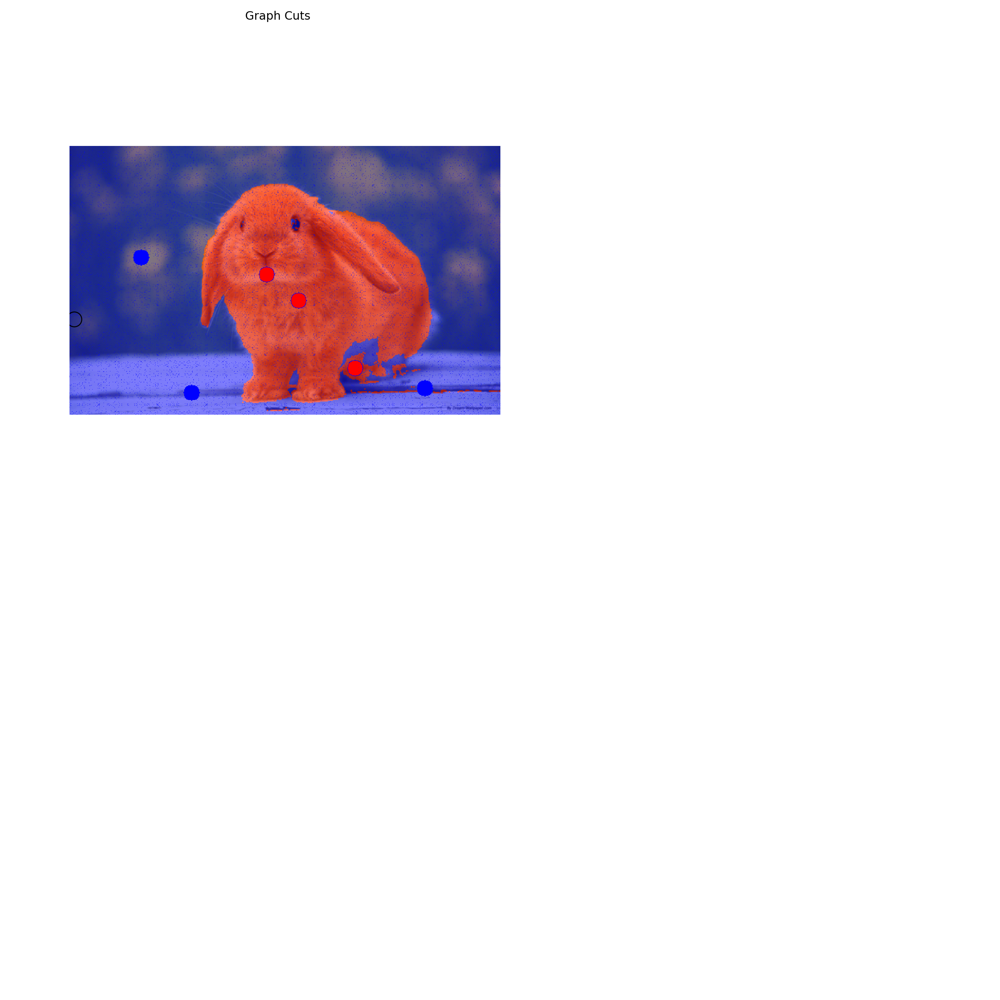

In [3]:
img1 = plt.imread('images/bunny.bmp')
app = MyGraphCuts(img1)
app.run()

Discussion:

First we start of with $\lambda = 0$. Where there is no $\lambda$ in the error function, we have no n-links. This means the image segmentation does not care about boundaries, it only uses the color consistency of the pixels to decide which group each one belongs to.

<IPython.core.display.Javascript object>


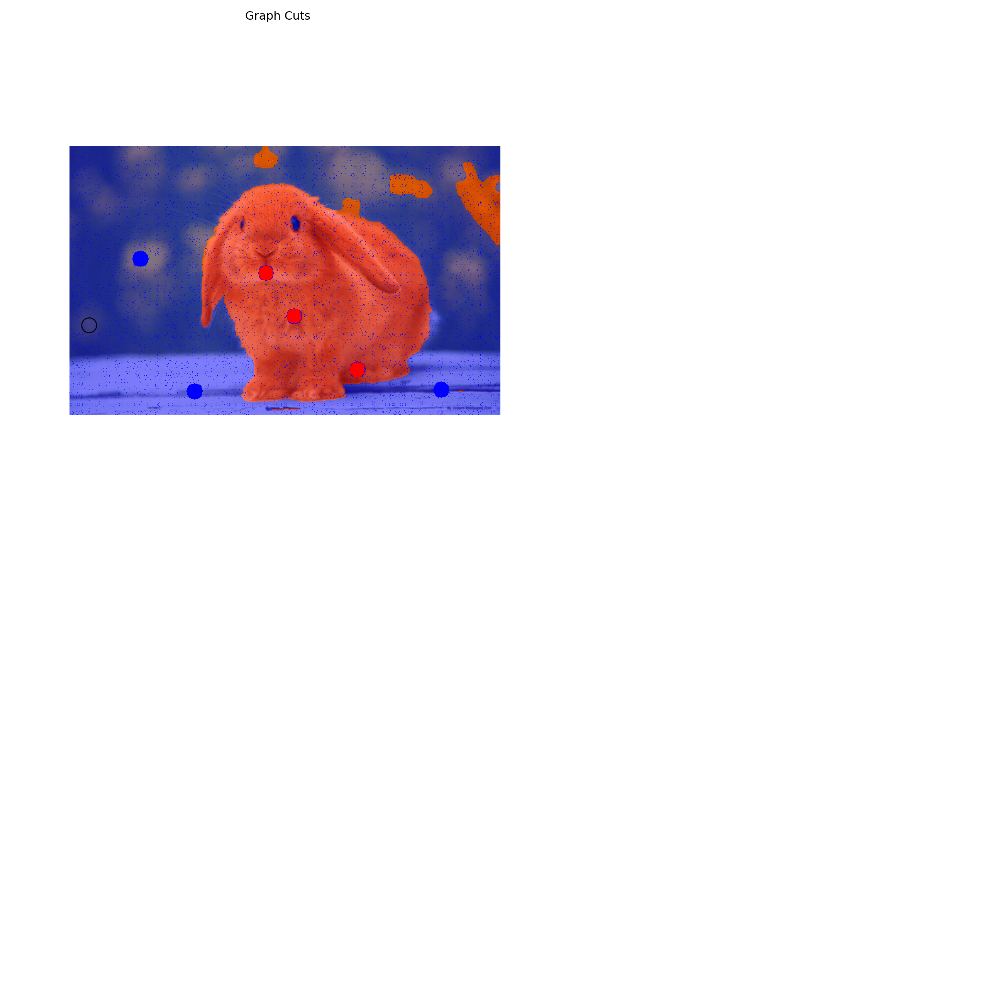

In [4]:
img1 = plt.imread('images/bunny.bmp')
app = MyGraphCuts(img1, _lambda=100)
app.run()

Discussion:

In this image we add n-link boundary information with $\lambda = 100$. This means that in the extreme case, the graph cut method will have to take a 100 cost penalty to cut one of these n-links. Specificially, this max penalty is paid for cuts that separate two pixels which have the _same color consistency_. Because of this, we encourage cuts between pixels which have very _different_ color consistencies. Those edges correspond to the borders of items.

We can see some improvements. The feet are now identified perfectly. The eyes are still misclassified. Also, the boundary on the bunny's back spilled into the yellow blob behind it because their colors were similar. Some points in the background also had enough object points and cheap enough boundary links to be misclassified.

We can try increasing $\lambda$ one more time.

<IPython.core.display.Javascript object>


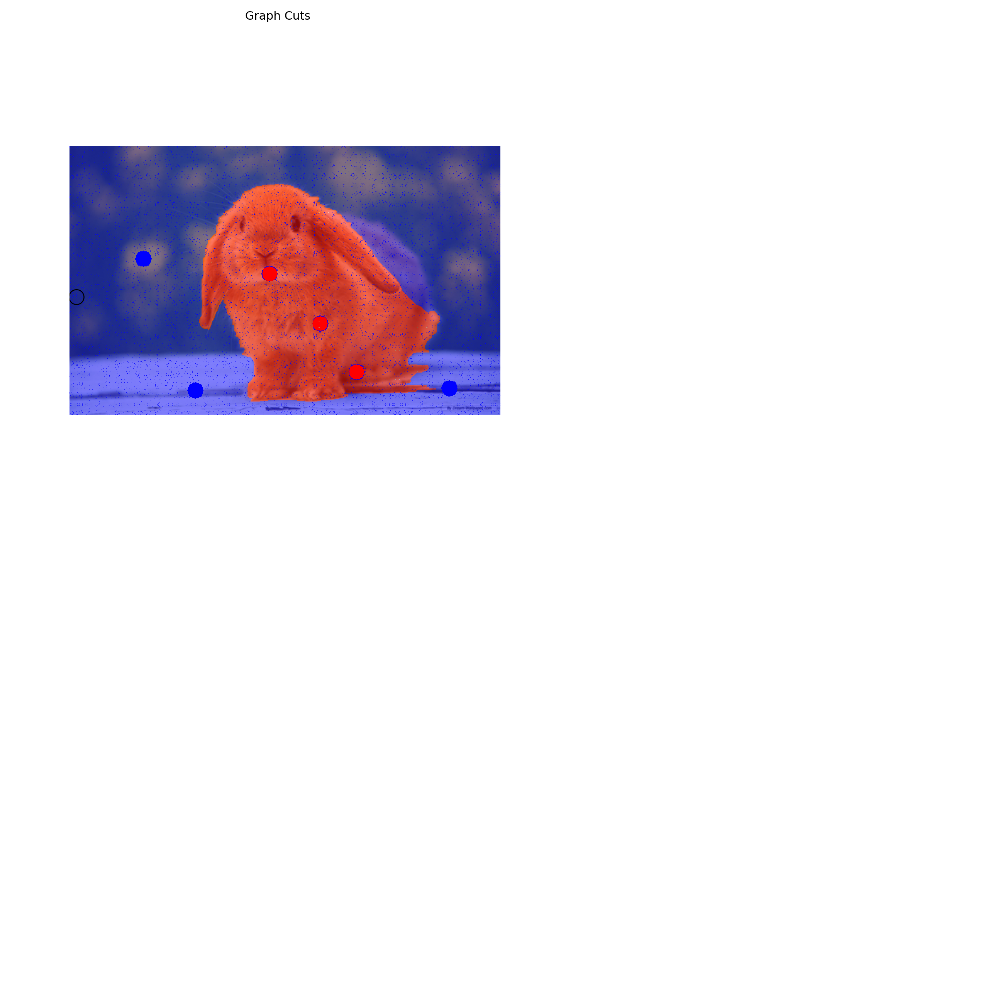

In [5]:
img1 = plt.imread('images/bunny.bmp')
app = MyGraphCuts(img1, _lambda=10_000)
app.run()

Discussion:

In this case we tried $\lambda = 10,000$. The boundary term had a lot of influence this time, as the solver had to work hard to avoid cutting these links with 10,000 cost.

This time the eye was correctly classified, but the bunny's back was misclassified. The solver felt that the contrast between the bunny's back and background wasn't stark enough, and instead it decided to cut along the contrast between the bunny's ear and the bunny's back. We can see clearly here how the boundary decided where the cut would be made more than the color difference (because based on colors alone the bunny's back is more like the rest of the bunny and doesn't resemble the background colors as much).

That's why we need a good in between value for $\lambda$ which balances boundary and color consistency influence.

<IPython.core.display.Javascript object>


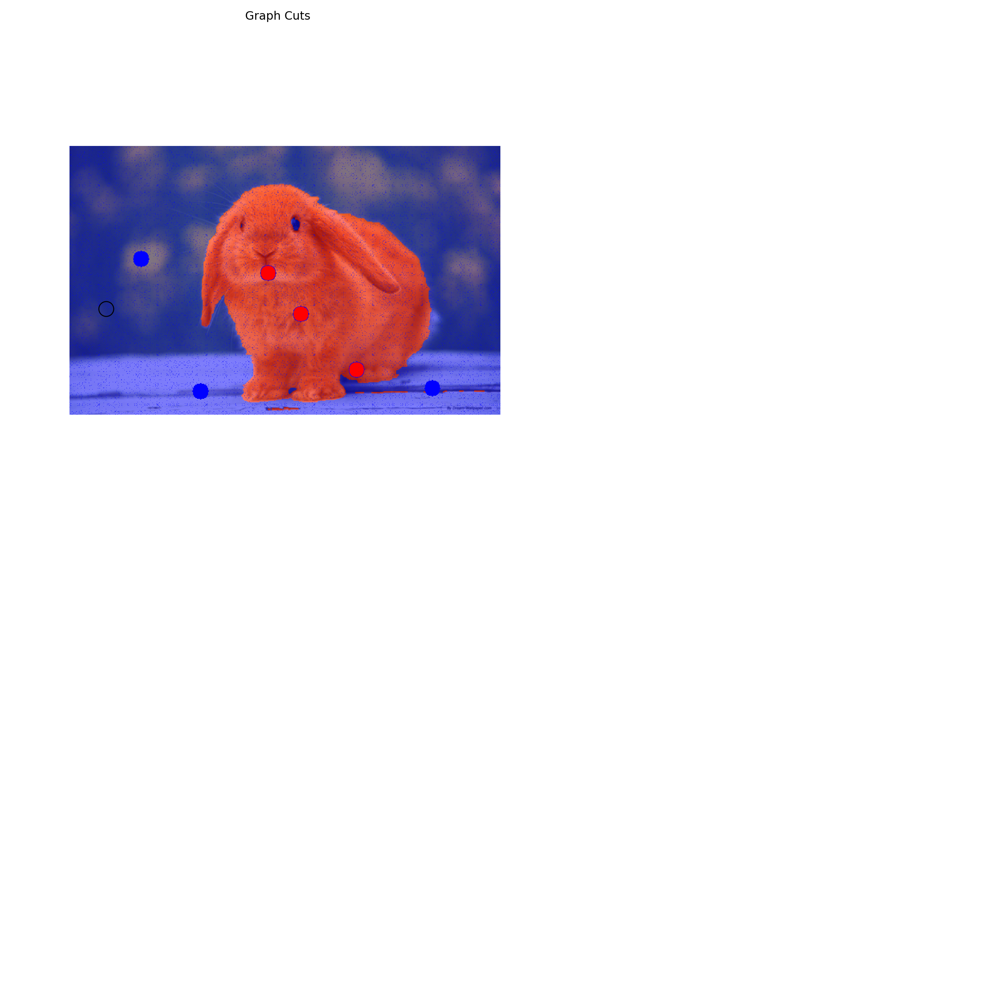

In [6]:
img1 = plt.imread('images/bunny.bmp')
app = MyGraphCuts(img1, _lambda=100, sigma=5)
app.run()

Discussion:

Going back to $\lambda = 100$, we now decrease $\sigma$ from 10 to 5. $\sigma$ represents the "bandwidth" or how much pixels can be a little more different than identical and _still_ have high penalties just like links between identical pixels do.

Here we notice that the background blob mistakes are gone.

$\sigma$ is especially hard to calculate because the best value for it should match the actual distribution of contrast jumps between pixels in the image you are using.

It is possible that when we made $\sigma$ smaller, we matched the distribution better and helped the solver make better decisions.

However, if we make $\sigma$ too low, penalties for cutting n-links would be cheap and favored so we would expect that bad cuts could be made and pixels misclassified.

To compare this, we see what happens if $\sigma$ is made large.

<IPython.core.display.Javascript object>


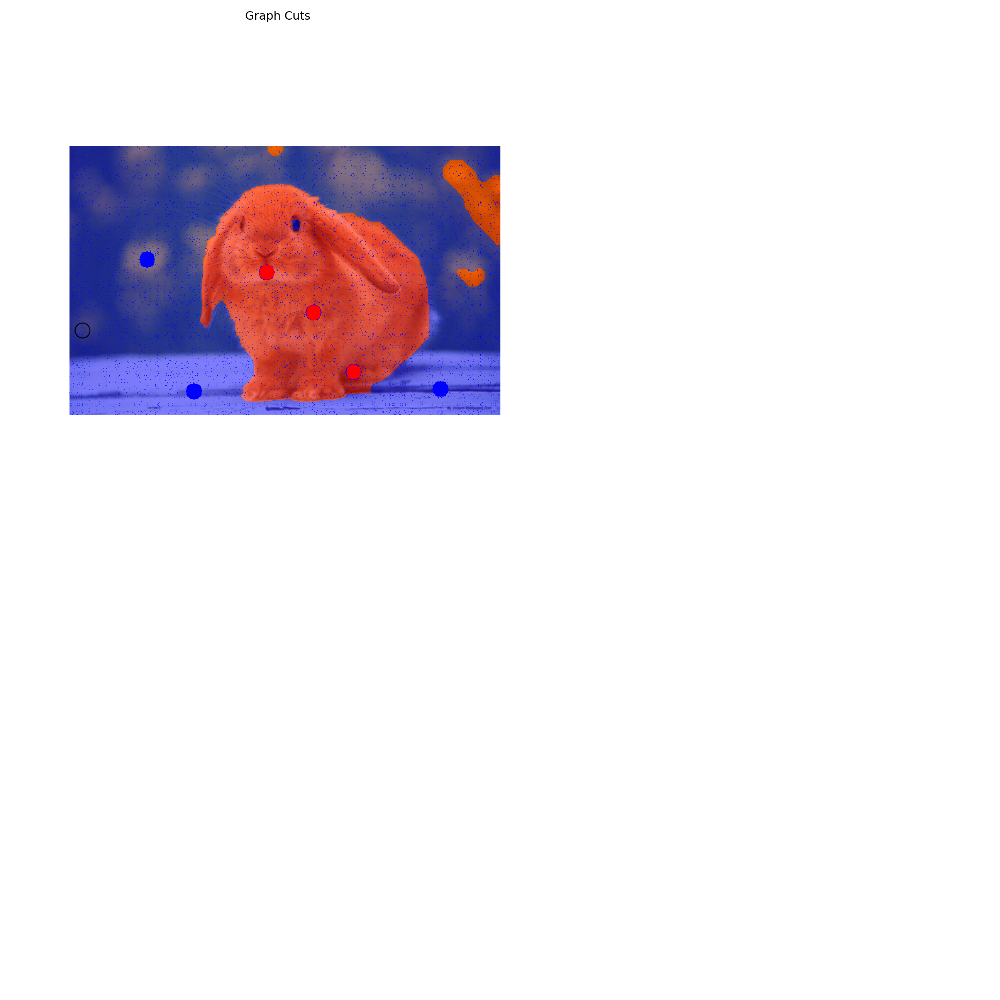

In [7]:
img1 = plt.imread('images/bunny.bmp')
app = MyGraphCuts(img1, _lambda=100, sigma=25)
app.run()

Discussion:

When we make $\sigma$ large again, we notice that the blobs are back. Here we must be missing the distribution and allowing good contrast borders to be given high penalites. Little noise red dots (probably from photoconsistency values) end up becoming big problems because whereas before cutting long "kind of" contrasting edges was "good enough", with the new high costs this is no longer optional. As a result, the solver decided it was worth it to desperately search for cheaper n-links to accomdate these noise values which ended up with misclassified background blobs that get assigned to the object instead of the background. You can see how those blobs still wrap around the yellow blurred items in the background.

However we saw in our trials that large $\sigma$ sometimes produced good results too because it really made the solver have to think before taking an n-link cost. However like we see here it can be susceptible to noise.

Conclusions:

Picking the right $\lambda$ and $\sigma$ values seriously help when it comes to identifying the correct segment for each pixel. To complete the discussion, we use the best parameters we found and as many points as we need to get a good split. We find that we don't need to add too many more if the right parameters are picked!

As a **suggestion for picking the right** $\sigma$ using a technical motivation, I would suggest that after all the pixel contrasts in all directions are calculated for the image, an additional step would be to use the `numpy.std` function to get the variance of the contrasts and use that as our $\sigma$ value. This should allow us to pick the parameter which suits the dataset given from the image.

<IPython.core.display.Javascript object>


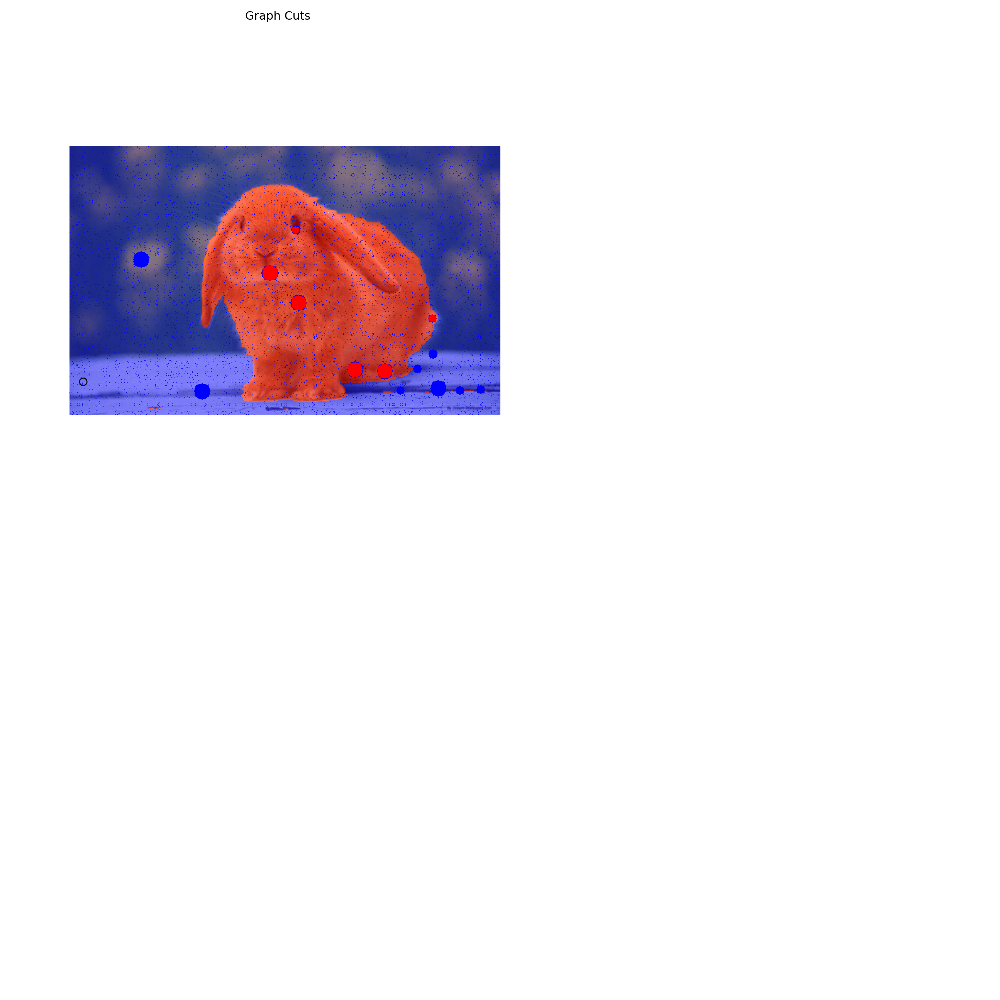

In [8]:
img1 = plt.imread('images/bunny.bmp')
app = MyGraphCuts(img1, _lambda=100, sigma=5)
app.run()

### Show how your interactive segmenter works on more challanging images where there is some overlap between the color-models in the object and background (as in the "lama" image). Compare the results for $\lambda=0$ (no regularization) and for some $\lambda>0$. For convenience, you might want to include $\lambda$ in the list of parameters for the function "MyGraphcuts".

<IPython.core.display.Javascript object>


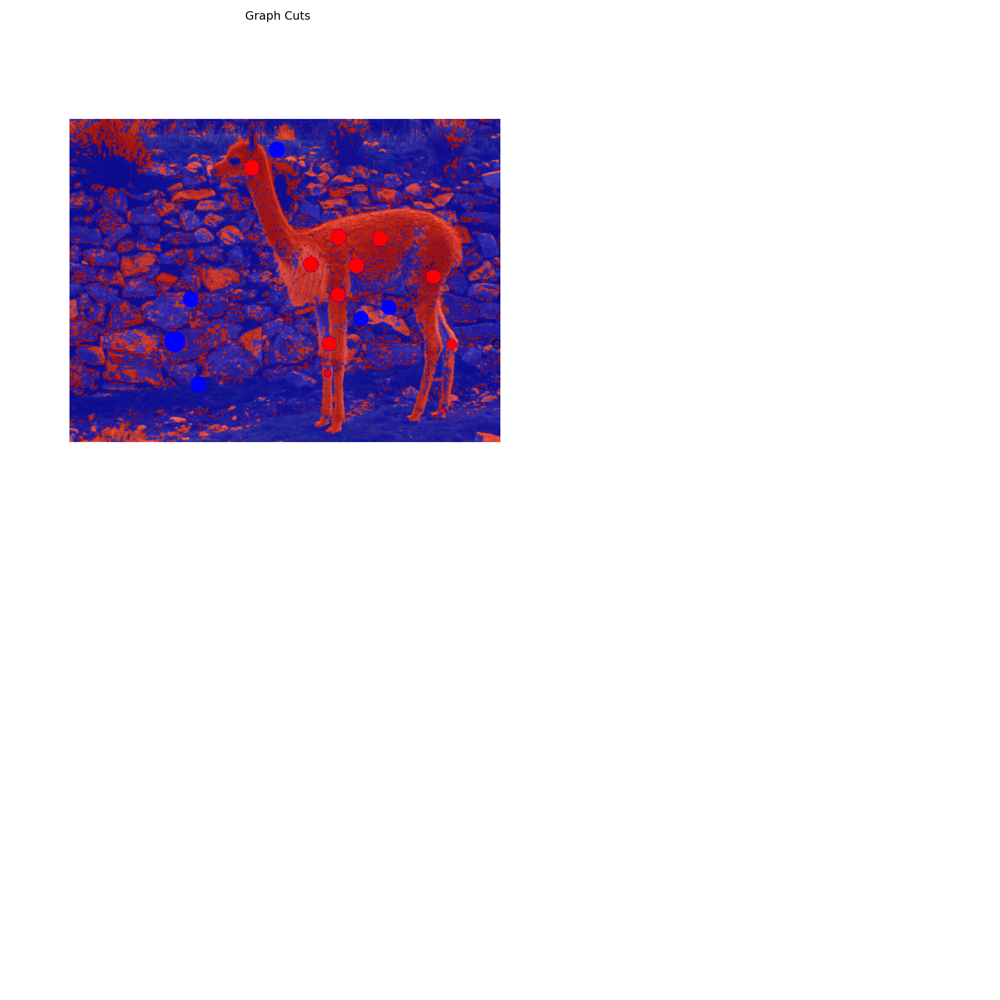

In [9]:
img2 = plt.imread('images/lama.jpg')
app = MyGraphCuts(img2, _lambda=0)
app.run()

Discussion:

In this harder example, the object blends in with the bakground rather well. If we don't use borders like in the example above, we see that we get a lot of noise. By using only the color consistency of the pixels, because $\lambda = 0$, the brown shades of the llama are confused with the brown shades on the rocks in the background.

<IPython.core.display.Javascript object>


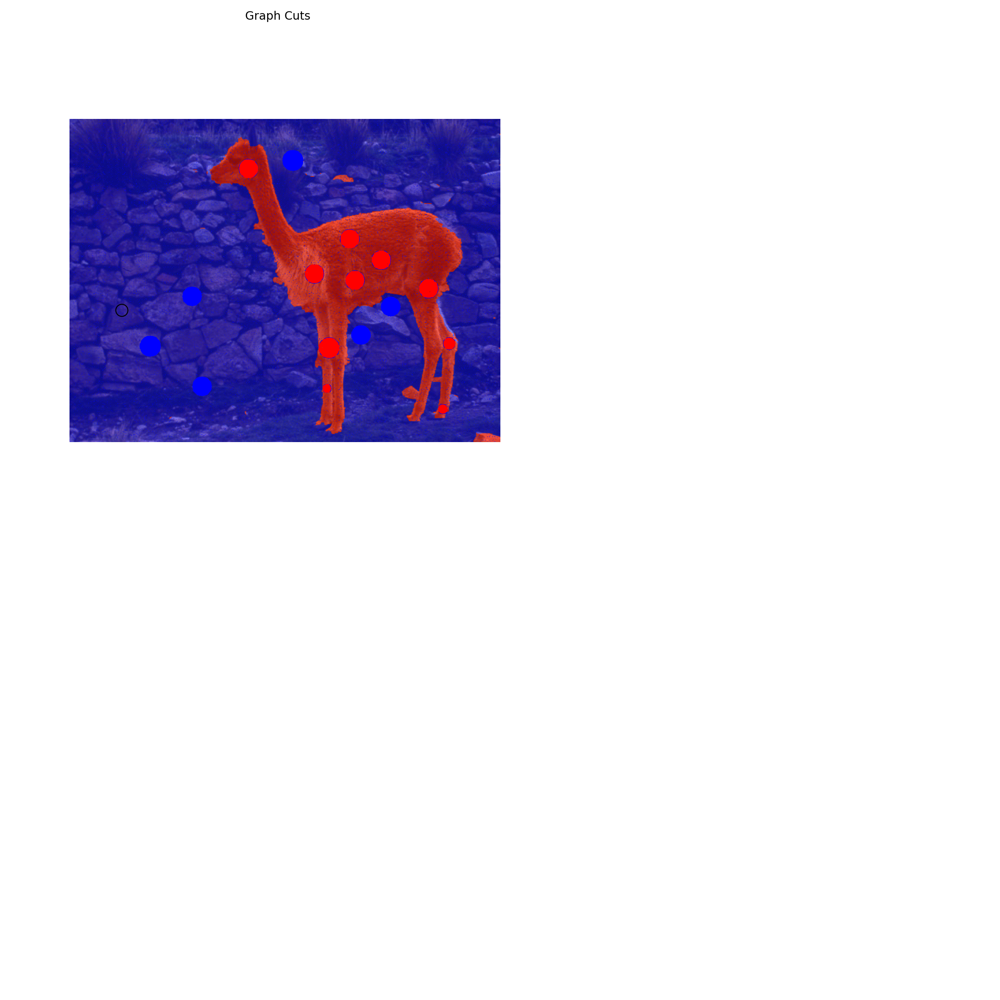

In [10]:
img2 = plt.imread('images/lama.jpg')
app = MyGraphCuts(img2, _lambda=100)
app.run()

Discussion:

We see that using the same points as above but by including $\lambda = 100$ so that borders are considered, we get a much better result. This makes sense because by including the borders the rocks are discouraged from cutting along all the expensive n-links where they have low contrast colors between pixels even if they are similar to the llama. Instead they would rather just cut the object t-links to give the pixels to the background. Likewise, the pixels of the llama reach the borders of the object and background where there are very happy to cut along the n-links because the high contrast makes those links cheap.

<IPython.core.display.Javascript object>


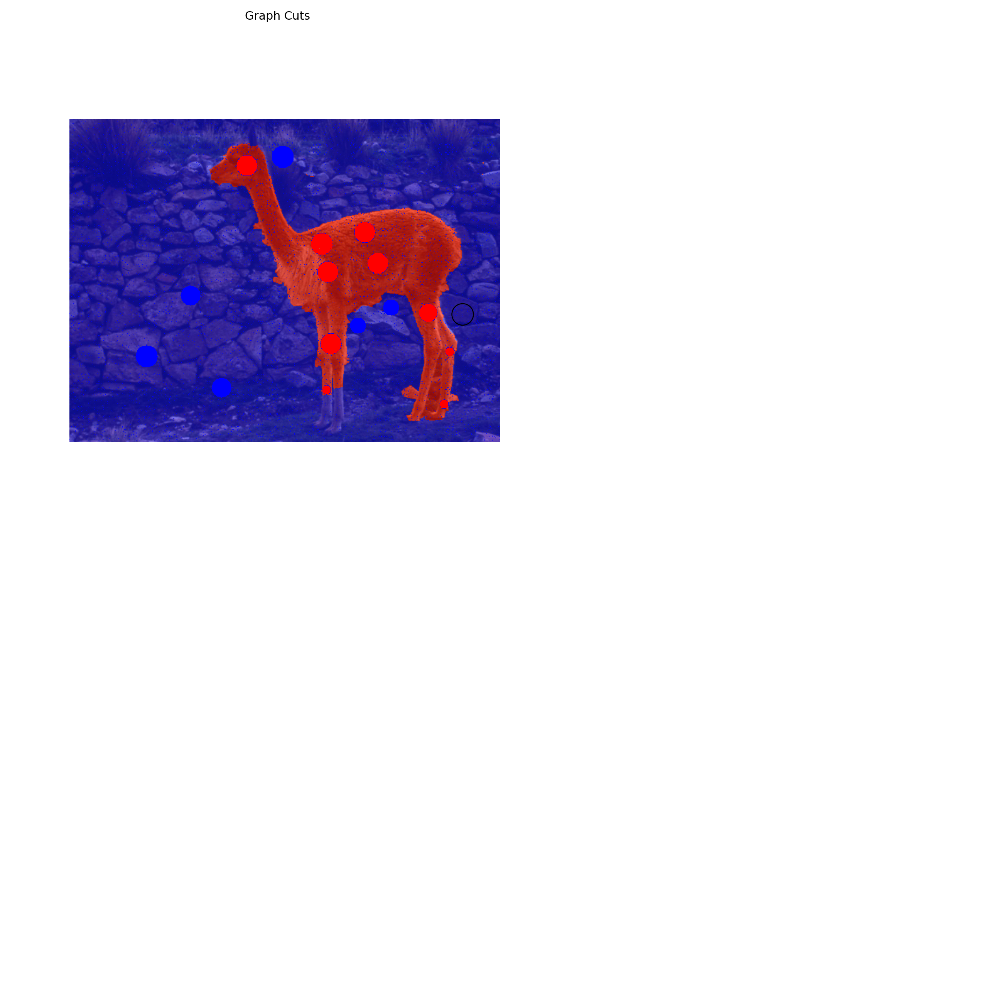

In [11]:
img2 = plt.imread('images/lama.jpg')
app = MyGraphCuts(img2, _lambda=1_000)
app.run()

Discussion:

If we make $\lambda$ too large, we see that borders become overly important so that the cut isn't able to reach down the leg because it stops at the seed and does not continue down.

Conclusion:

Since we found parameters that worked well, $\lambda = 100$ and $\sigma = 10$, we can add more seeds to the image to help the solver correctly classify the remaining space between the llama's back legs and some noise-y rocks to get a good cut of the object from the background.

<IPython.core.display.Javascript object>


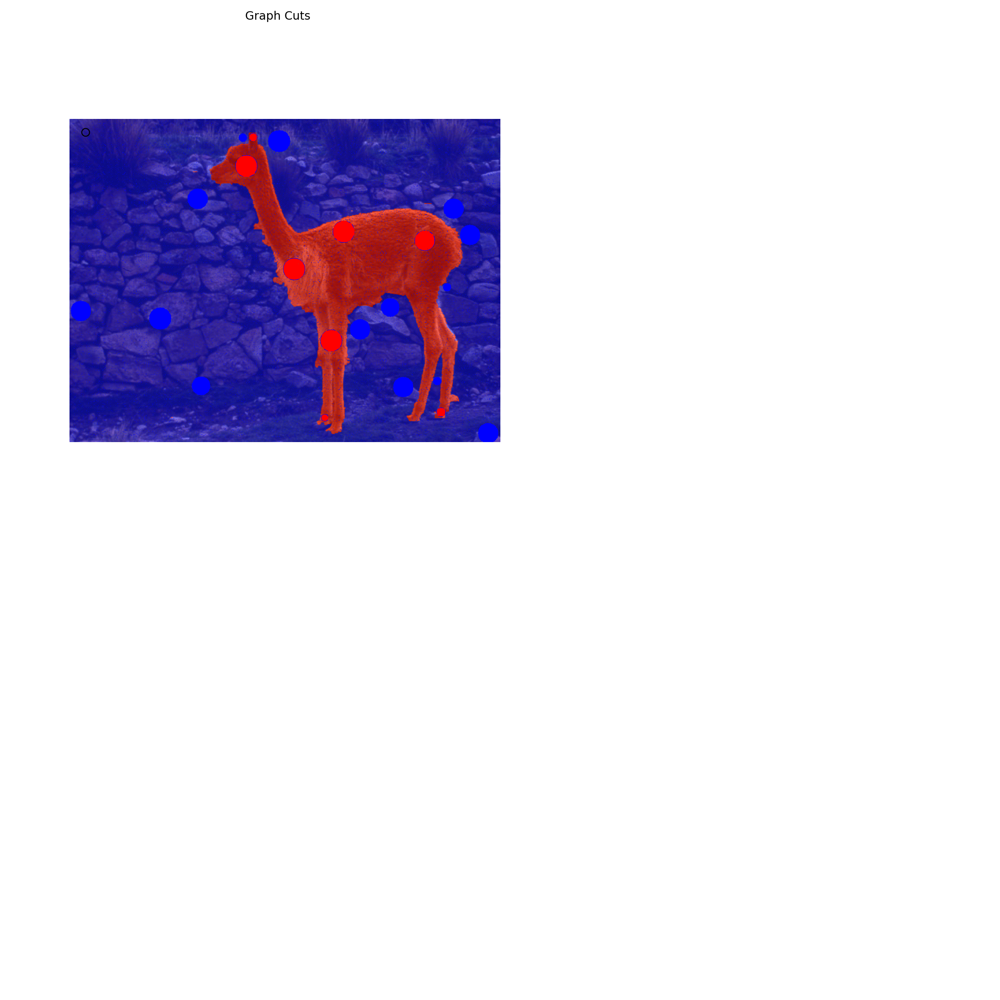

In [13]:
img2 = plt.imread('images/lama.jpg')
app = MyGraphCuts(img2, _lambda=100)
app.run()